<a href="https://colab.research.google.com/github/salomebla/demo/blob/main/Replicate_One.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q --upgrade keras-cv
!pip install -q --upgrade keras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 613.1/613.1 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 32.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 8.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 3.0.4 which is incompatible.


In [2]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"  # For Google Colab, use "tensorflow" backend


In [3]:
import json
import math
import numpy as np

import keras
from keras import losses
from keras import ops
from keras import optimizers
from keras.optimizers import schedules
from keras import metrics

import keras_cv

# Import tensorflow for [`tf.data`](https://www.tensorflow.org/api_docs/python/tf/data) and its preprocessing functions
import tensorflow as tf
import tensorflow_datasets as tfds

In [4]:
classifier = keras_cv.models.ImageClassifier.from_preset("efficientnetv2_b0_imagenet_classifier")

100%|██████████| 2.80k/2.80k [00:00<00:00, 4.16MB/s]
100%|██████████| 28.0M/28.0M [00:00<00:00, 109MB/s]


45500/45500 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


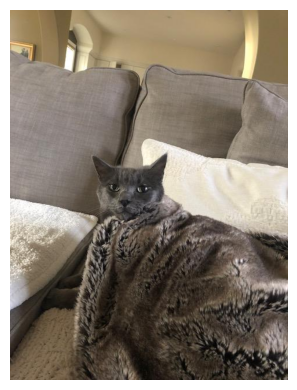

In [5]:
filepath = keras.utils.get_file(origin="https://i.imgur.com/9i63gLN.jpg")
image = keras.utils.load_img(filepath)
image = np.array(image)
keras_cv.visualization.plot_image_gallery(
    np.array([image]), rows=1, cols=1, value_range=(0, 255), show=True, scale=4
)

In [6]:
predictions = classifier.predict(np.expand_dims(image, axis=0))

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


In [7]:
top_classes = predictions[0].argsort(axis=-1)


In [8]:
classes = keras.utils.get_file(
    origin="https://gist.githubusercontent.com/LukeWood/62eebcd5c5c4a4d0e0b7845780f76d55/raw/fde63e5e4c09e2fa0a3436680f436bdcb8325aac/ImagenetClassnames.json"
)
with open(classes, "rb") as f:
    classes = json.load(f)

33567/33567 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [9]:
top_two = [classes[str(i)] for i in top_classes[-2:]]
print("Top two classes are:", top_two)

Top two classes are: ['Egyptian cat', 'velvet']


Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


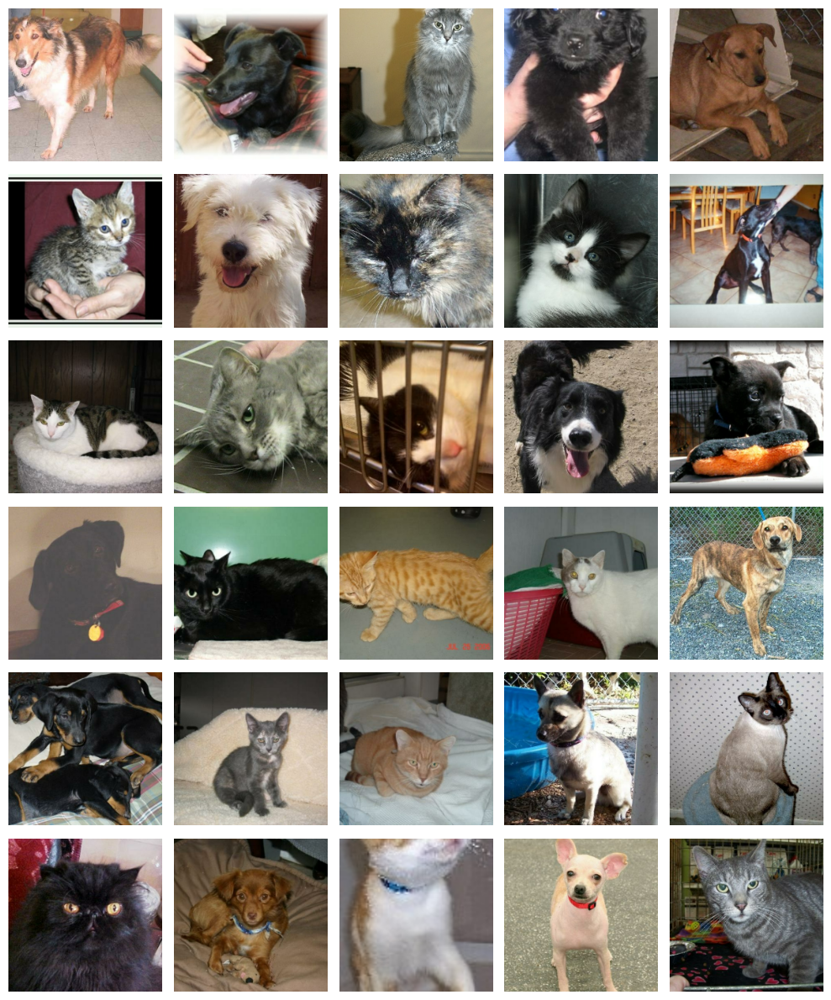

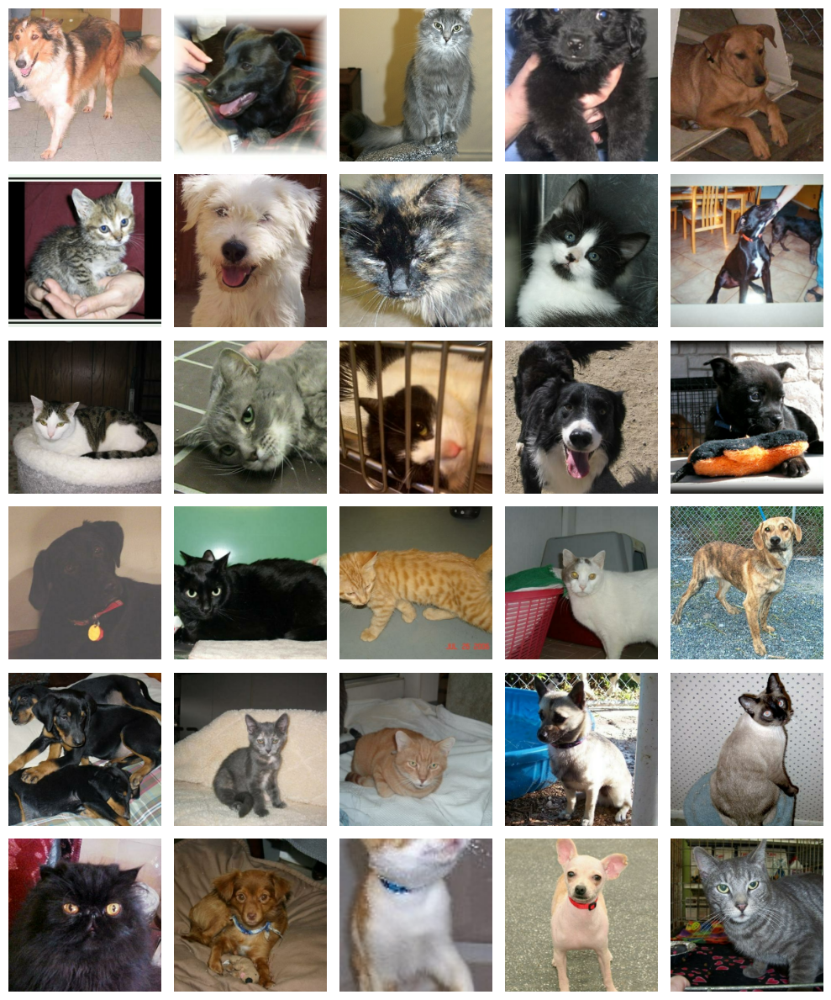

In [10]:
BATCH_SIZE = 32
IMAGE_SIZE = (224, 224)
AUTOTUNE = tf.data.AUTOTUNE
tfds.disable_progress_bar()

data, dataset_info = tfds.load("cats_vs_dogs", with_info=True, as_supervised=True)
train_steps_per_epoch = dataset_info.splits["train"].num_examples // BATCH_SIZE
train_dataset = data["train"]

num_classes = dataset_info.features["label"].num_classes

resizing = keras_cv.layers.Resizing(
    IMAGE_SIZE[0], IMAGE_SIZE[1], crop_to_aspect_ratio=True
)


def preprocess_inputs(image, label):
    image = tf.cast(image, tf.float32)
    # Staticly resize images as we only iterate the dataset once.
    return resizing(image), tf.one_hot(label, num_classes)


# Shuffle the dataset to increase diversity of batches.
# 10*BATCH_SIZE follows the assumption that bigger machines can handle bigger
# shuffle buffers.
train_dataset = train_dataset.shuffle(
    10 * BATCH_SIZE, reshuffle_each_iteration=True
).map(preprocess_inputs, num_parallel_calls=AUTOTUNE)
train_dataset = train_dataset.batch(BATCH_SIZE)

images = next(iter(train_dataset.take(1)))[0]
keras_cv.visualization.plot_image_gallery(images, value_range=(0, 255))

In [11]:
model = keras_cv.models.ImageClassifier.from_preset(
    "efficientnetv2_b0_imagenet", num_classes=2
)
model.compile(
    loss="categorical_crossentropy",
    optimizer=keras.optimizers.SGD(learning_rate=0.01),
    metrics=["accuracy"],
)

100%|██████████| 1.79k/1.79k [00:00<00:00, 806kB/s]
100%|██████████| 23.1M/23.1M [00:00<00:00, 77.4MB/s]


In [12]:
model.fit(train_dataset)


727/727 ━━━━━━━━━━━━━━━━━━━━ 5217s 7s/step - accuracy: 0.9099 - loss: 0.3492


In [13]:
predictions = model.predict(np.expand_dims(image, axis=0))

classes = {0: "cat", 1: "dog"}
print("Top class is:", classes[predictions[0].argmax()])

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Top class is: cat


In [14]:
NUM_CLASSES = 101
# Change epochs to 100~ to fully train.
EPOCHS = 1


def package_inputs(image, label):
    return {"images": image, "labels": tf.one_hot(label, NUM_CLASSES)}


train_ds, eval_ds = tfds.load(
    "caltech101", split=["train", "test"], as_supervised="true"
)
train_ds = train_ds.map(package_inputs, num_parallel_calls=tf.data.AUTOTUNE)
eval_ds = eval_ds.map(package_inputs, num_parallel_calls=tf.data.AUTOTUNE)

train_ds = train_ds.shuffle(BATCH_SIZE * 16)

Dataset caltech101 downloaded and prepared to /root/tensorflow_datasets/caltech101/3.0.2. Subsequent calls will reuse this data.


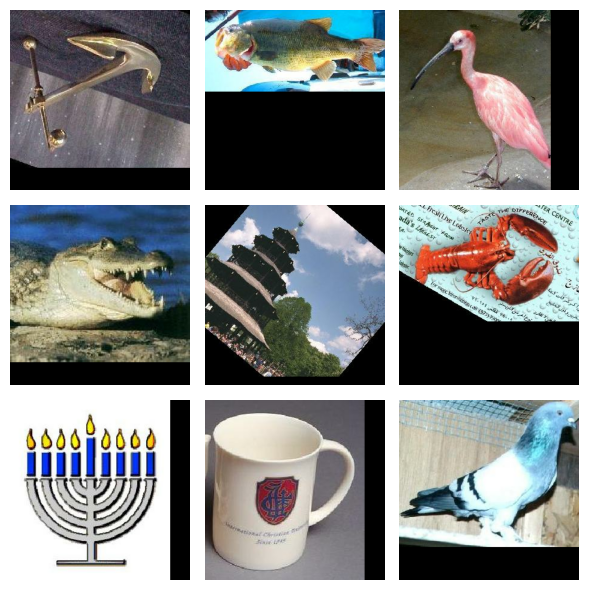

In [15]:
train_ds = train_ds.ragged_batch(BATCH_SIZE)
eval_ds = eval_ds.ragged_batch(BATCH_SIZE)

batch = next(iter(train_ds.take(1)))
image_batch = batch["images"]
label_batch = batch["labels"]

keras_cv.visualization.plot_image_gallery(
    image_batch.to_tensor(),
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

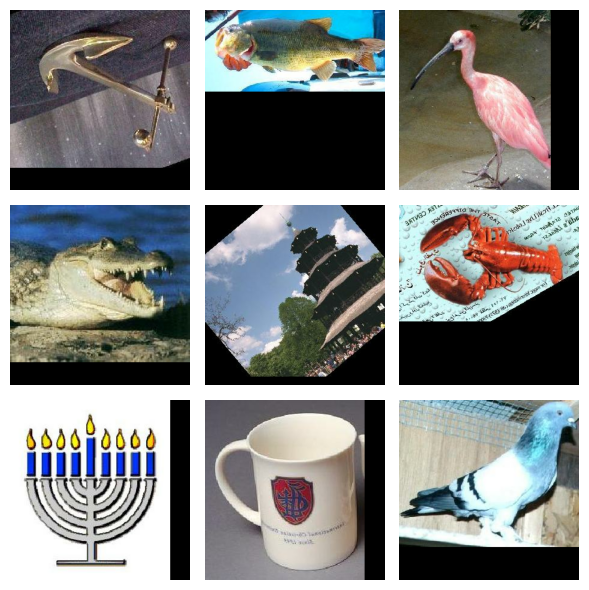

In [16]:
random_flip = keras_cv.layers.RandomFlip()
augmenters = [random_flip]

image_batch = random_flip(image_batch)
keras_cv.visualization.plot_image_gallery(
    image_batch.to_tensor(),
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

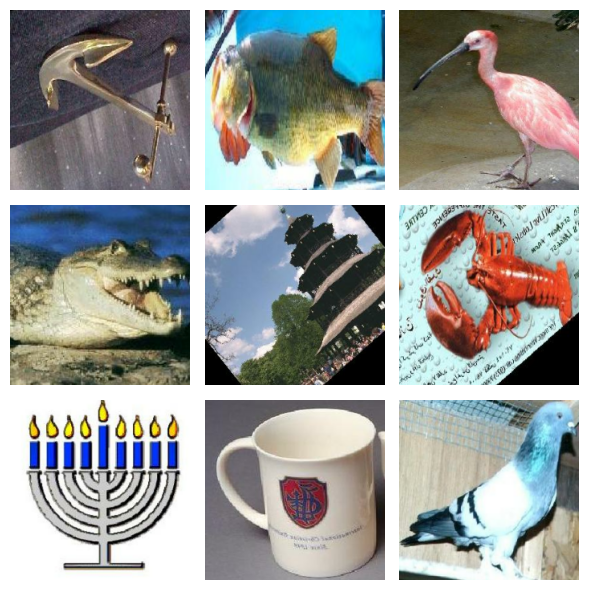

In [17]:
crop_and_resize = keras_cv.layers.RandomCropAndResize(
    target_size=IMAGE_SIZE,
    crop_area_factor=(0.8, 1.0),
    aspect_ratio_factor=(0.9, 1.1),
)
augmenters += [crop_and_resize]

image_batch = crop_and_resize(image_batch)
keras_cv.visualization.plot_image_gallery(
    image_batch,
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

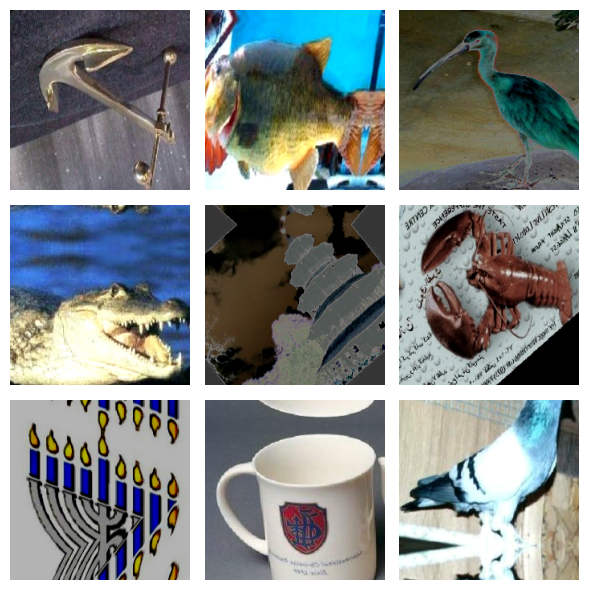

In [18]:
rand_augment = keras_cv.layers.RandAugment(
    augmentations_per_image=3,
    value_range=(0, 255),
    magnitude=0.3,
    magnitude_stddev=0.2,
    rate=1.0,
)
augmenters += [rand_augment]

image_batch = rand_augment(image_batch)
keras_cv.visualization.plot_image_gallery(
    image_batch,
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

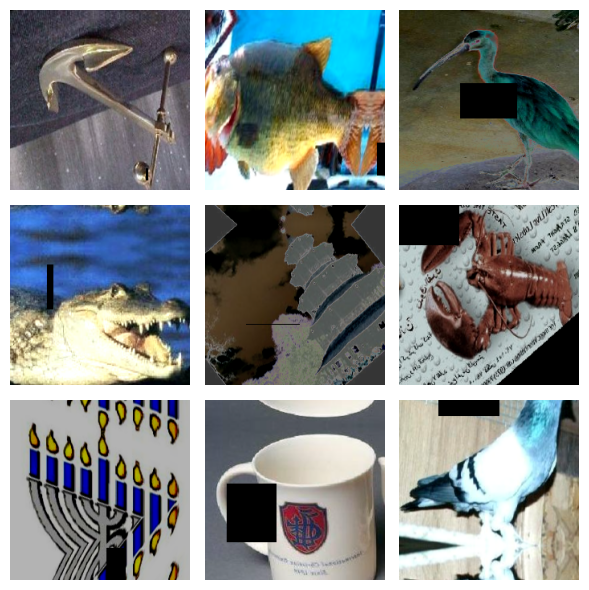

In [19]:
random_cutout = keras_cv.layers.RandomCutout(width_factor=0.4, height_factor=0.4)
keras_cv.visualization.plot_image_gallery(
    random_cutout(image_batch),
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

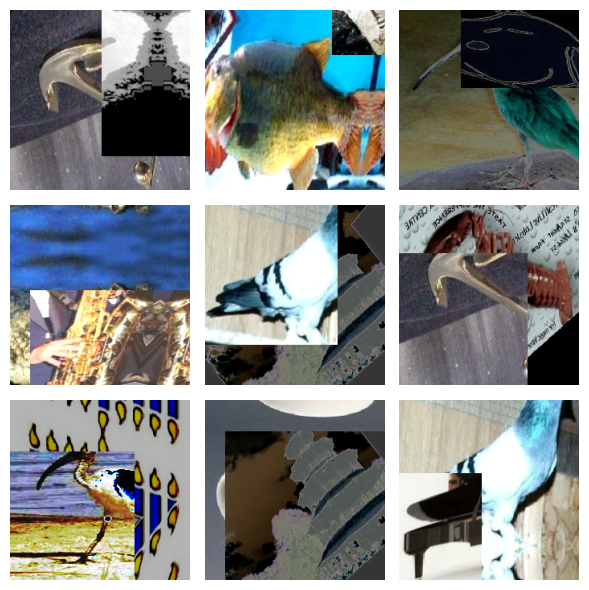

In [20]:
cut_mix = keras_cv.layers.CutMix()
# CutMix needs to modify both images and labels
inputs = {"images": image_batch, "labels": label_batch}

keras_cv.visualization.plot_image_gallery(
    cut_mix(inputs)["images"],
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

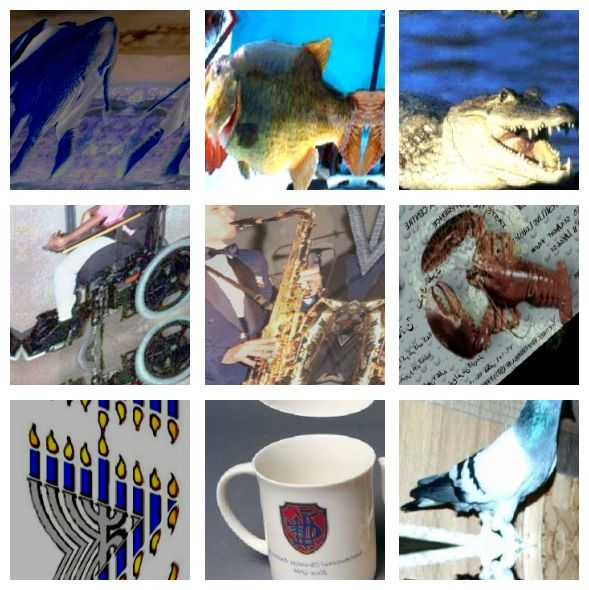

In [21]:
mix_up = keras_cv.layers.MixUp()
# MixUp needs to modify both images and labels
inputs = {"images": image_batch, "labels": label_batch}

keras_cv.visualization.plot_image_gallery(
    mix_up(inputs)["images"],
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

In [22]:
cut_mix_or_mix_up = keras_cv.layers.RandomChoice([cut_mix, mix_up], batchwise=True)
augmenters += [cut_mix_or_mix_up]

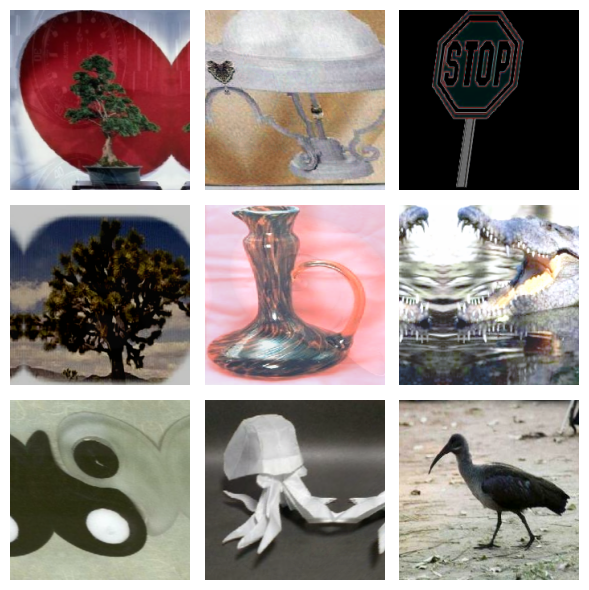

In [23]:
def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs

    return augmenter_fn


augmenter_fn = create_augmenter_fn(augmenters)
train_ds = train_ds.map(augmenter_fn, num_parallel_calls=tf.data.AUTOTUNE)

image_batch = next(iter(train_ds.take(1)))["images"]
keras_cv.visualization.plot_image_gallery(
    image_batch,
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)

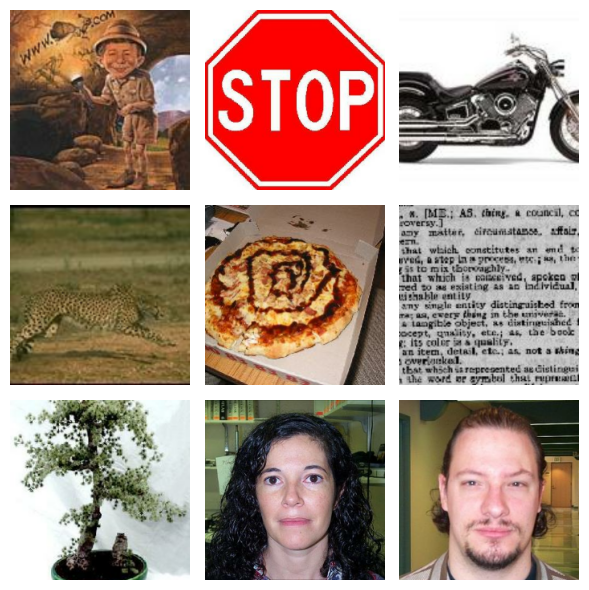

In [24]:
inference_resizing = keras_cv.layers.Resizing(
    IMAGE_SIZE[0], IMAGE_SIZE[1], crop_to_aspect_ratio=True
)
eval_ds = eval_ds.map(inference_resizing, num_parallel_calls=tf.data.AUTOTUNE)

image_batch = next(iter(eval_ds.take(1)))["images"]
keras_cv.visualization.plot_image_gallery(
    image_batch,
    rows=3,
    cols=3,
    value_range=(0, 255),
    show=True,
)


In [25]:
def unpackage_dict(inputs):
    return inputs["images"], inputs["labels"]


train_ds = train_ds.map(unpackage_dict, num_parallel_calls=tf.data.AUTOTUNE)
eval_ds = eval_ds.map(unpackage_dict, num_parallel_calls=tf.data.AUTOTUNE)

In [26]:
def lr_warmup_cosine_decay(
    global_step,
    warmup_steps,
    hold=0,
    total_steps=0,
    start_lr=0.0,
    target_lr=1e-2,
):
    # Cosine decay
    learning_rate = (
        0.5
        * target_lr
        * (
            1
            + ops.cos(
                math.pi
                * ops.convert_to_tensor(
                    global_step - warmup_steps - hold, dtype="float32"
                )
                / ops.convert_to_tensor(
                    total_steps - warmup_steps - hold, dtype="float32"
                )
            )
        )
    )

    warmup_lr = target_lr * (global_step / warmup_steps)

    if hold > 0:
        learning_rate = ops.where(
            global_step > warmup_steps + hold, learning_rate, target_lr
        )

    learning_rate = ops.where(global_step < warmup_steps, warmup_lr, learning_rate)
    return learning_rate


class WarmUpCosineDecay(schedules.LearningRateSchedule):
    def __init__(self, warmup_steps, total_steps, hold, start_lr=0.0, target_lr=1e-2):
        super().__init__()
        self.start_lr = start_lr
        self.target_lr = target_lr
        self.warmup_steps = warmup_steps
        self.total_steps = total_steps
        self.hold = hold

    def __call__(self, step):
        lr = lr_warmup_cosine_decay(
            global_step=step,
            total_steps=self.total_steps,
            warmup_steps=self.warmup_steps,
            start_lr=self.start_lr,
            target_lr=self.target_lr,
            hold=self.hold,
        )

        return ops.where(step > self.total_steps, 0.0, lr)

In [27]:
total_images = 9000
total_steps = (total_images // BATCH_SIZE) * EPOCHS
warmup_steps = int(0.1 * total_steps)
hold_steps = int(0.45 * total_steps)
schedule = WarmUpCosineDecay(
    start_lr=0.05,
    target_lr=1e-2,
    warmup_steps=warmup_steps,
    total_steps=total_steps,
    hold=hold_steps,
)
optimizer = optimizers.SGD(
    weight_decay=5e-4,
    learning_rate=schedule,
    momentum=0.9,
)

In [28]:
backbone = keras_cv.models.EfficientNetV2B0Backbone()
model = keras.Sequential(
    [
        backbone,
        keras.layers.GlobalMaxPooling2D(),
        keras.layers.Dropout(rate=0.5),
        keras.layers.Dense(101, activation="softmax"),
    ]
)

100%|██████████| 1.77k/1.77k [00:00<00:00, 3.28MB/s]


In [29]:
loss = losses.CategoricalCrossentropy(label_smoothing=0.1)

In [30]:
model.compile(
    loss=loss,
    optimizer=optimizer,
    metrics=[
        metrics.CategoricalAccuracy(),
        metrics.TopKCategoricalAccuracy(k=5),
    ],
)

In [31]:
model.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=eval_ds,
)

96/96 ━━━━━━━━━━━━━━━━━━━━ 1253s 12s/step - categorical_accuracy: 0.0100 - loss: 8.3862 - top_k_categorical_accuracy: 0.0406 - val_categorical_accuracy: 0.0347 - val_loss: 253.7430 - val_top_k_categorical_accuracy: 0.0858
